In [1]:
import numpy as np
import pandas as pd
import csv
from math import ceil
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import joblib
from sklearn.decomposition import TruncatedSVD

In [2]:
print("\nReading input files...")
tf_matrix=[]
with open(("../Abstracts_vect.txt"), mode='r') as file:
	for line in file:
		tf_matrix.append(line.strip('\n\r').split("\t"))

nc = len(tf_matrix) #number of components
tf_matrix = csr_matrix(tf_matrix, dtype='double')
print("Done!\n")


Reading input files...
Done!



In [6]:
X = tf_matrix
X

<2200x13670 sparse matrix of type '<class 'numpy.float64'>'
	with 30071800 stored elements in Compressed Sparse Row format>

In [11]:
nc = 2200

In [15]:
print("Performing SVD reduction...")
svd = TruncatedSVD(n_components=nc, random_state=42)
X_reduced = svd.fit_transform(X)
exp_var = svd.explained_variance_ratio_.cumsum()
params = svd.get_params()


Performing SVD reduction...


In [25]:
cont = 1
for i in exp_var:
    if(i >= 0.7):
        break
    cont += 1
X_reduced = X_reduced[0:nc,0:cont]

AttributeError: 'numpy.ndarray' object has no attribute 'toarray'

In [40]:
X_reduced

[[0.06813432882490064,
  -0.012907985771770679,
  -0.0008071344136720144,
  -0.04614394732188525,
  0.022293164780196717,
  2.451149612388822e-05,
  -0.07010017212373115,
  -0.02281018170435671,
  0.021505994649384158,
  0.017890579310948663,
  -0.057593572730442306,
  0.060287322249240875,
  -0.018793021571288843,
  0.06540393764064675,
  0.035730400480134324,
  0.05652055099245536,
  0.088382555631971,
  -0.054713366191463705,
  0.03458640773677267,
  0.004983329015708757,
  -0.023629786857054035,
  0.03708238920772839,
  0.0800597090392682,
  0.12124561326967592,
  0.09440211653731793,
  -0.054661639628897536,
  0.01972105217044528,
  -0.11523912404173756,
  -0.08417525466276311,
  -0.05678005856678328,
  -0.010360980145929337,
  0.03634310104718898,
  0.0366182293727867,
  0.1098896429068962,
  -0.13359797077503505,
  -0.14281304123622834,
  -0.024227319824674874,
  0.12844003068540866,
  -0.14700380326879997,
  0.0675789673277599,
  0.08923221521481216,
  -0.03912359063287339,
  -

In [39]:
with open("../Asbracts_vect_reduced.tsv", 'w') as file:
	for i in X_reduced:
		for j in i:
			file.write("{}\t".format(j))
		file.write("\n")

In [4]:
from sklearn.datasets import make_blobs

tf_matrix, y = make_blobs(
    n_samples=500,
    n_features=2,
    centers=4,
    cluster_std=1,
    center_box=(-10.0, 10.0),
    shuffle=True,
    random_state=1,
)

tf_matrix

array([[-6.92324165e+00, -1.06695320e+01],
       [-8.63062033e+00, -7.13940564e+00],
       [-9.63048069e+00, -2.72044935e+00],
       [-2.30647659e+00,  5.30797676e+00],
       [-7.57005366e+00, -3.01446491e+00],
       [-1.00051011e+00,  2.77905153e+00],
       [-4.81826839e+00, -2.77214822e+00],
       [-5.33964799e+00, -1.27625764e+00],
       [-7.94308840e+00, -3.89993901e+00],
       [-5.54924525e+00, -3.41298968e+00],
       [-5.14508990e+00, -9.54492198e+00],
       [-7.09669936e+00, -8.04074036e+00],
       [-5.82641512e+00, -1.96346196e+00],
       [-1.83198811e+00,  3.52863145e+00],
       [-7.34267235e+00, -3.16546482e+00],
       [-7.34072825e+00, -6.92427252e+00],
       [-7.94653906e+00, -3.36768655e+00],
       [-8.24598536e+00, -8.61315821e+00],
       [-1.98197711e+00,  4.02243551e+00],
       [-4.35098035e+00, -3.69476678e+00],
       [-1.04768696e+01, -3.60318139e+00],
       [-1.10195984e+01, -3.15882031e+00],
       [-5.17255904e+00, -4.31835971e+00],
       [-2.

In [5]:
pd.DataFrame(tf_matrix).to_csv("../temp/blobs.tsv", sep="\t", index=False, header=False)

In [7]:
lim_inf = 2
lim_sup = 10
search = True

global_scores = {}
while(search):
    step = ceil((lim_sup-lim_inf)/10)
    K = range(lim_inf, lim_sup+step, step)
    print(f"Searching in the interval between {lim_inf} and {lim_sup+step}...")
    scores = []
    for k in K:
        labels = KMeans(n_clusters=k, init="k-means++", random_state=200).fit(tf_matrix).labels_
        score = silhouette_score(tf_matrix, labels, metric="euclidean", sample_size=1000,random_state=200)
        print ("Silhouette score for k(clusters) = " +str(k)+ " is "
            +str(score))
        scores.append(score)
        global_scores[k] = score
    if(step > 1):
        max_k = K[max(range(len(scores)), key=scores.__getitem__)]
        print(f"Maximun average score found in k = {max_k}")
        lim_inf = max_k-ceil(step/2)
        lim_sup=max_k+ceil(step/2)
        if(lim_inf <= 0): lim_inf = lim_inf - lim_inf + 2
    else: search = False

global_scores = dict(sorted(global_scores.items(), key=lambda item: item[1], reverse=True))
print(f"Max silhouette average score found in k = {list(global_scores.keys())[0]}")

Searching in the interval between 2 and 11...
Silhouette score for k(clusters) = 2 is 0.7049787496083262
Silhouette score for k(clusters) = 3 is 0.5882004012129721
Silhouette score for k(clusters) = 4 is 0.6505186632729437
Silhouette score for k(clusters) = 5 is 0.5745029081702377
Silhouette score for k(clusters) = 6 is 0.4539787564295229
Silhouette score for k(clusters) = 7 is 0.39305413589393634
Silhouette score for k(clusters) = 8 is 0.3907828017481829
Silhouette score for k(clusters) = 9 is 0.33243406771823447
Silhouette score for k(clusters) = 10 is 0.3475316997102484
Max silhouette average score found in k = 2


In [16]:
global_scores

{2: [0.7049787496083262,
  0.5882004012129721,
  0.6505186632729437,
  0.5745029081702377,
  0.4539787564295229,
  0.39305413589393634,
  0.3907828017481829,
  0.33243406771823447,
  0.3475316997102484,
  0.3346851397077007,
  0.33770662925588646,
  0.3600432480777632,
  0.35348683385349733,
  0.3326171797060057,
  0.3438656307642266,
  0.34643903042359514,
  0.334267400241403,
  0.3351353641070246,
  0.3415775366884513],
 3: [0.7049787496083262,
  0.5882004012129721,
  0.6505186632729437,
  0.5745029081702377,
  0.4539787564295229,
  0.39305413589393634,
  0.3907828017481829,
  0.33243406771823447,
  0.3475316997102484,
  0.3346851397077007,
  0.33770662925588646,
  0.3600432480777632,
  0.35348683385349733,
  0.3326171797060057,
  0.3438656307642266,
  0.34643903042359514,
  0.334267400241403,
  0.3351353641070246,
  0.3415775366884513],
 4: [0.7049787496083262,
  0.5882004012129721,
  0.6505186632729437,
  0.5745029081702377,
  0.4539787564295229,
  0.39305413589393634,
  0.39078280

Other possible K:


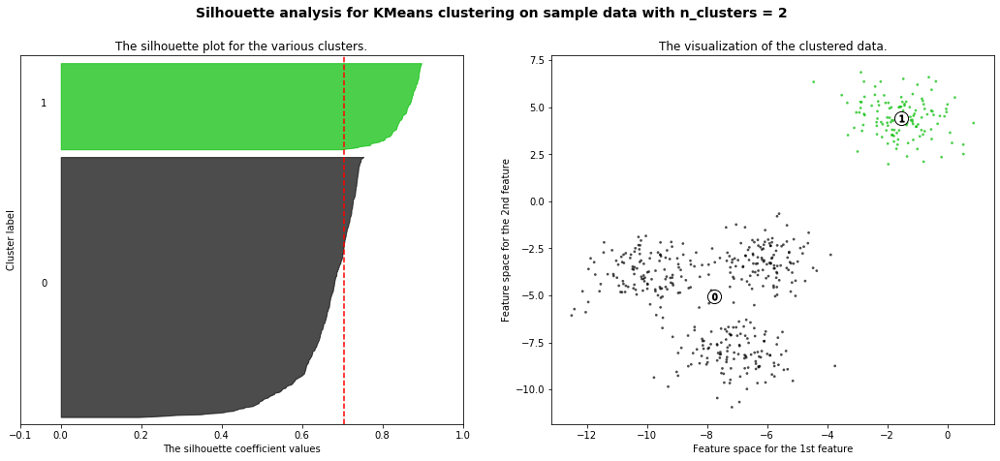

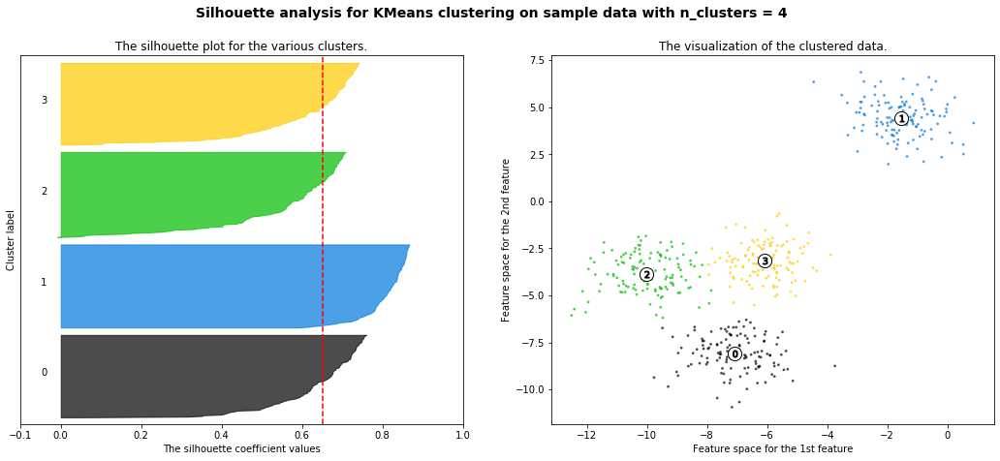

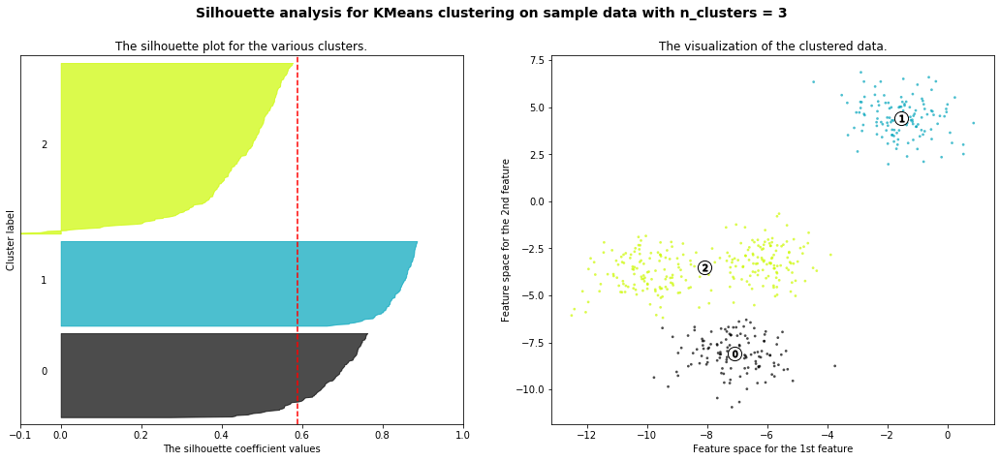

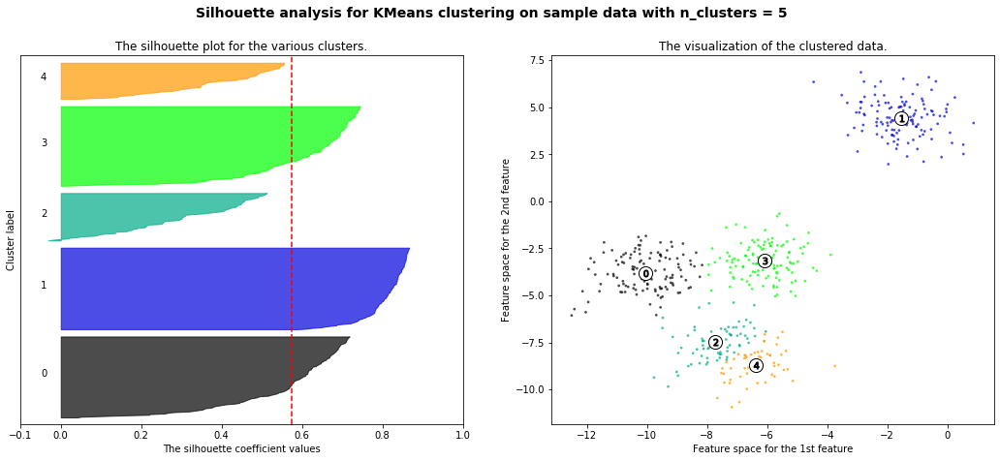

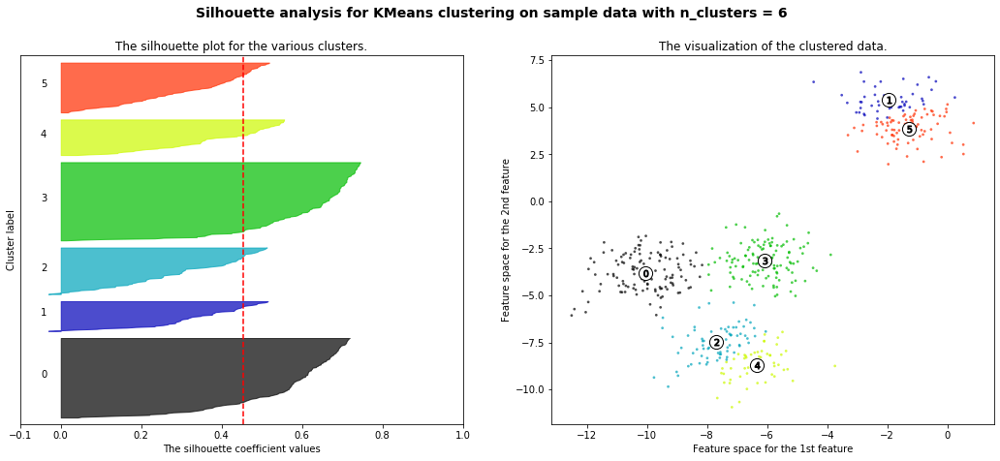

In [29]:

print("Other possible K:")

global_scores = joblib.load("../temp/scores.joblib")
X = tf_matrix.toarray()

for n_clusters in list(global_scores.keys())[0:5]:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, tf_matrix.shape[0] + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, init="k-means++", random_state=200)
    cluster_labels = clusterer.fit_predict(tf_matrix)

    silhouette_avg = global_scores[n_clusters]

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(tf_matrix, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )
    plt.savefig(f'../temp/plt_{n_clusters}.png')
plt.show()



In [30]:
global_scores

{2: 0.7049787496083262,
 4: 0.6505186632729437,
 3: 0.5882004012129721,
 5: 0.5745029081702377,
 6: 0.4539787564295229,
 7: 0.39305413589393634,
 8: 0.3907828017481829,
 10: 0.3475316997102484,
 9: 0.33243406771823447}

[2, 3, 4, 5, 6]
For n_clusters = 2 The average silhouette_score is : 0.7049787496083261
For n_clusters = 3 The average silhouette_score is : 0.5882004012129721
For n_clusters = 4 The average silhouette_score is : 0.6505186632729437
For n_clusters = 5 The average silhouette_score is : 0.5745566973301872
For n_clusters = 6 The average silhouette_score is : 0.4387644975296138


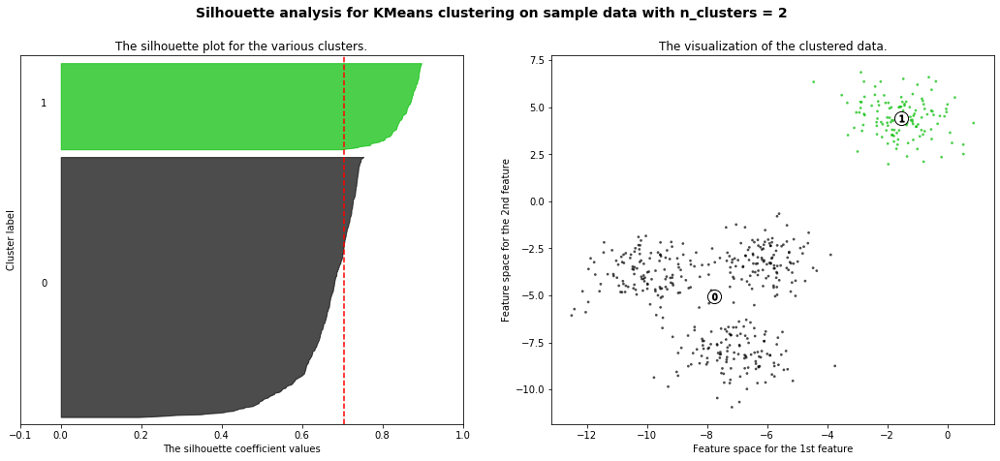

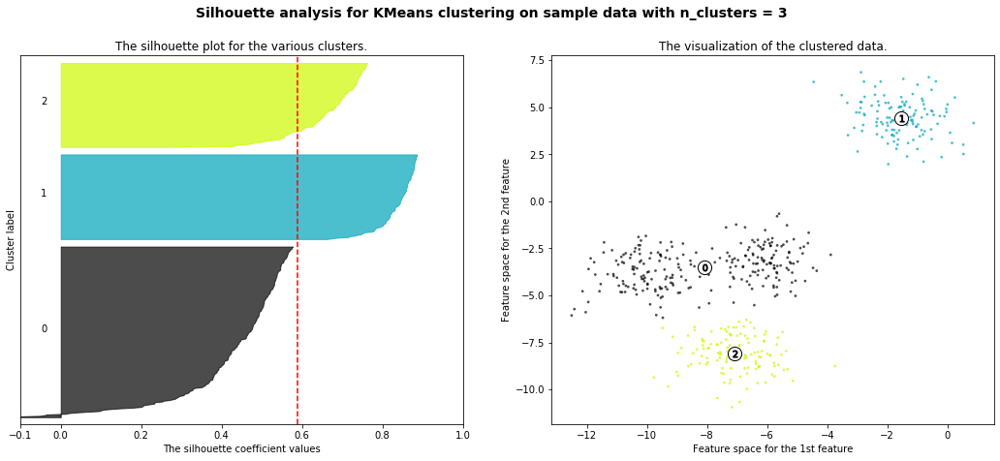

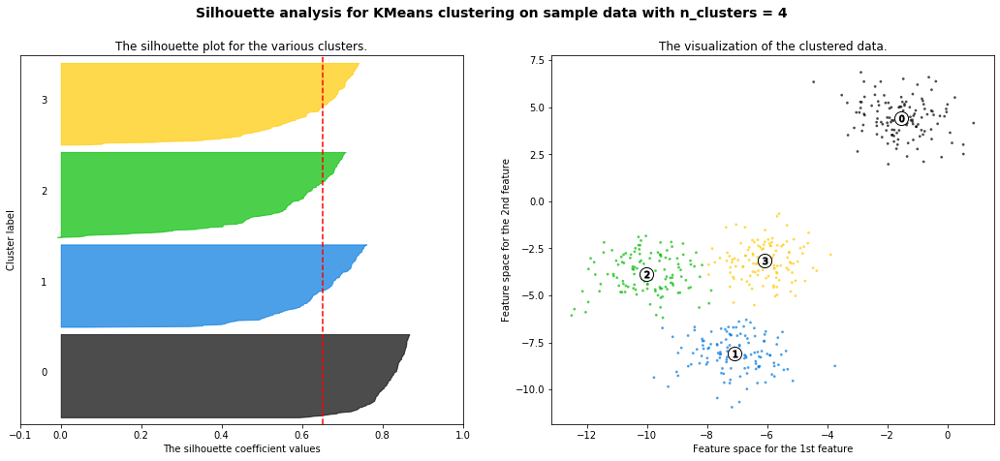

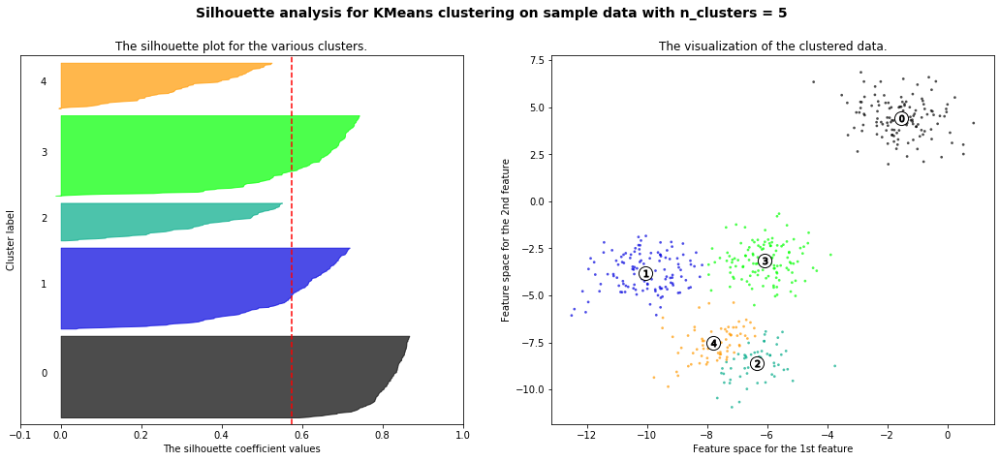

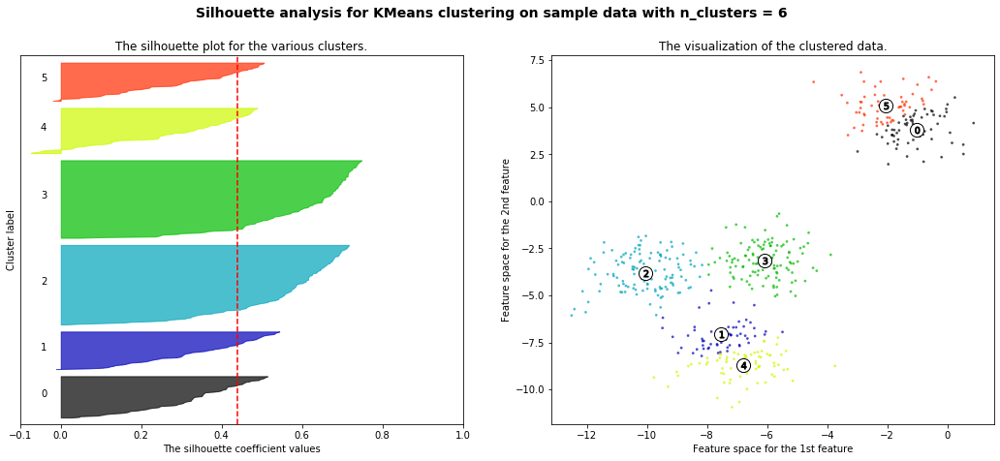

In [12]:
range_n_clusters = list(global_scores.keys())[0:5]
print(range_n_clusters)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [71]:
tf_matrix.shape[0]

2200

In [7]:
from threading import Thread

In [54]:
import threading
  
def print_cube(num):
    """
    function to print cube of given num
    """
    print("Cube: {}".format(num * num * num))
    results.append(num * num * num)
  
def print_square(num):
    """
    function to print square of given num
    """
    print("Square: {}".format(num * num))
  

ts = 12
r = range(10, 100, 10)
# creating thread
i = 0
results = []
while True:
    threads = []
    for n in range(ts):
        print(i)
        print(r[i])
        t = Thread(target=print_cube(r[i]))
        threads.append(t)
        if i == len(r)-1: break
        else: i += 1
    for t in threads: t.start()
    for t in threads: t.join()
    if i >= len(r)-1: break
    

# both threads completely executed
print("Done!")
results

0
10
Cube: 1000
1
20
Cube: 8000
2
30
Cube: 27000
3
40
Cube: 64000
4
50
Cube: 125000
5
60
Cube: 216000
6
70
Cube: 343000
7
80
Cube: 512000
8
90
Cube: 729000
Done!


[1000, 8000, 27000, 64000, 125000, 216000, 343000, 512000, 729000]

In [48]:
len(r)-1

8

In [32]:
# thread_test.py

import random
import threading
from threading import ThreadWithReturnValue


def list_append(count, id, out_list):
    """
    Creates an empty list and then appends a 
    random number to the list 'count' number
    of times. A CPU-heavy operation!
    """
    for i in range(count):
        out_list.append(random.random())

if __name__ == "__main__":
    size = 10000000   # Number of random numbers to add
    threads = 2   # Number of threads to create

    # Create a list of jobs and then iterate through
    # the number of threads appending each thread to
    # the job list 
    jobs = []
    for i in range(0, threads):
        out_list = list()
        thread = threading.Thread.ThreadWithReturnValue(target=list_append(size, i, out_list))
        jobs.append(thread)

    # Start the threads (i.e. calculate the random number lists)
    for j in jobs:
        j.start()

    # Ensure all of the threads have finished
    for j in jobs:
        j.join()

    print("List processing complete.")

ImportError: cannot import name 'ThreadWithReturnValue' from 'threading' (/Users/joelrodriguez/opt/anaconda3/lib/python3.7/threading.py)